In [1]:
# تثبيت مكتبة umap-learn
!pip install umap-learn --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 3.6 MB/s eta 0:00:00


In [2]:
!pip install albumentations==1.4.0 opencv-python


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.6/123.6 kB 4.2 MB/s eta 0:00:00
  Attempting uninstall: albumentations
    Found existing installation: albumentations 2.0.4
    Uninstalling albumentations-2.0.4:
      Successfully uninstalled albumentations-2.0.4


In [3]:
# %% Cleaned Imports

# Standard library
import os
import random
import shutil
from collections import OrderedDict, Counter, defaultdict

# Data handling
import pandas as pd
import numpy as np

# Image I/O and basic stats
from PIL import Image, ImageStat, UnidentifiedImageError
import cv2

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Progress bar
from tqdm import tqdm

# Machine learning / clustering / metrics
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, MDS
from sklearn.metrics import (
    silhouette_score,
    silhouette_samples,
    davies_bouldin_score,
    calinski_harabasz_score
)
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics.pairwise import cosine_distances, cosine_similarity

# Distance / statistics
from scipy.stats import wasserstein_distance, norm, zscore
from scipy.spatial.distance import cdist
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import squareform

# Image quality & texture
from skimage.metrics import structural_similarity as ssim
from skimage.measure import shannon_entropy
from skimage import color

# Dimensionality reduction
import umap

# Deep learning feature extraction
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import Model

2025-05-03 08:20:42.955719: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746260443.158853      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746260443.219845      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [4]:
import torch
print("CUDA:", torch.cuda.is_available())
print("Device count:", torch.cuda.device_count())
print("Current device:", torch.cuda.get_device_name(0))


CUDA: True
Device count: 1
Current device: Tesla P100-PCIE-16GB


In [5]:
# مسار الصور على Kaggle
data_path = "/kaggle/input/food-101-reduced/food-101-reduced/images"

# قراءة الأصناف
class_names = sorted(os.listdir(data_path))

# طباعة النتيجة
print(f"عدد الأصناف: {len(class_names)}")
print("أسماء الأصناف:")
print(class_names)

عدد الأصناف: 15
أسماء الأصناف:
['apple_pie', 'bread_pudding', 'caesar_salad', 'cheesecake', 'donuts', 'french_fries', 'grilled_salmon', 'ice_cream', 'pizza', 'ramen', 'samosa', 'steak', 'sushi', 'tacos', 'waffles']


In [8]:
import os, random, shutil
from collections import defaultdict
from sklearn.model_selection import train_test_split

base_input = "/kaggle/input/food-101-reduced/food-101-reduced/images"
meta_dir   = "/kaggle/input/food-101-reduced/food-101-reduced/meta"
output_dir = "/kaggle/working/food-101-split"

# اقرأ قائمة الصور من train.txt
with open(os.path.join(meta_dir, "train.txt")) as f:
    train_files = [line.strip() for line in f]

# خزن كل مسار في dict حسب الصنف
by_class = defaultdict(list)
for path in train_files:
    cls, fn = path.split('/')
    by_class[cls].append(path)

train_split, val_split = [], []
# لكل صنف: stratified split بنسبة 15% للـ val
for cls, paths in by_class.items():
    tr, va = train_test_split(
        paths,
        test_size=0.15,
        random_state=42  # للـ reproducibility
    )
    train_split += tr
    val_split   += va

# اقرأ test.txt
with open(os.path.join(meta_dir, "test.txt")) as f:
    test_split = [line.strip() for line in f]

def copy_images(file_list, split_name):
    for path in file_list:
        cls, fn = path.split('/')
        src = os.path.join(base_input, cls, fn + ".jpg")
        dst_dir = os.path.join(output_dir, split_name, cls)
        os.makedirs(dst_dir, exist_ok=True)
        shutil.copy(src, os.path.join(dst_dir, fn + ".jpg"))

# أنسخ
copy_images(train_split, "train")
copy_images(val_split,   "val")
copy_images(test_split,  "test")

print("✅ تم التقسيم بطريقة stratified لكل صنف (train/val/test)")


✅ تم التقسيم بطريقة stratified لكل صنف (train/val/test)


In [9]:
# مسار الـ output split
output_dir = "/kaggle/working/food-101-split"
splits     = ["train","val","test"]

# 1) إجمالي عدد الصور في كل split
print("=== Total per split ===")
for split in splits:
    split_path = os.path.join(output_dir, split)
    total = sum(len(files) for _, _, files in os.walk(split_path))
    print(f"{split:5s}: {total} صورة")
print()

# 2) عدد الصور لكل فئة داخل كل split
print("=== Per-class counts ===")
records = []
for split in splits:
    split_path = os.path.join(output_dir, split)
    for cls in os.listdir(split_path):
        cls_path = os.path.join(split_path, cls)
        if os.path.isdir(cls_path):
            cnt = len([f for f in os.listdir(cls_path) if f.lower().endswith('.jpg')])
            records.append({"split": split, "class": cls, "count": cnt})

df_counts = pd.DataFrame(records)
# جدول محوري pivot
pivot = df_counts.pivot(index="class", columns="split", values="count").fillna(0).astype(int)
print(pivot)

=== Total per split ===
train: 9555 صورة
val  : 1695 صورة
test : 3750 صورة

=== Per-class counts ===
split           test  train  val
class                           
apple_pie        250    637  113
bread_pudding    250    637  113
caesar_salad     250    637  113
cheesecake       250    637  113
donuts           250    637  113
french_fries     250    637  113
grilled_salmon   250    637  113
ice_cream        250    637  113
pizza            250    637  113
ramen            250    637  113
samosa           250    637  113
steak            250    637  113
sushi            250    637  113
tacos            250    637  113
waffles          250    637  113


/tmp/ipykernel_31/1015358614.py:27: UserWarning: Glyph 128995 (\N{LARGE PURPLE CIRCLE}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128995 (\N{LARGE PURPLE CIRCLE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


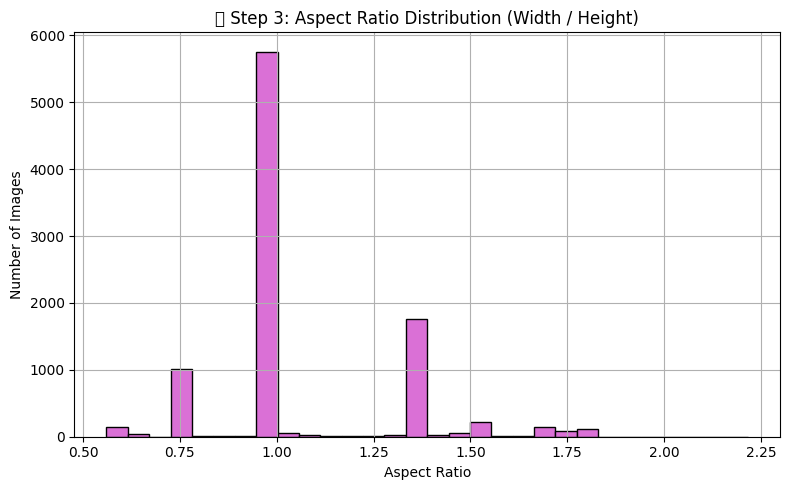

In [10]:
# لو مش معرفه فوق، ضيف ده
train_dir = "/kaggle/working/food-101-split/train"

# حساب الـ Aspect Ratio (width / height)
aspect_ratios = []

for cls in os.listdir(train_dir):
    cls_path = os.path.join(
        train_dir, cls)
    for img_name in os.listdir(cls_path):
        img_path = os.path.join(cls_path, img_name)
        try:
            with Image.open(img_path) as img:
                w, h = img.size
                if h != 0:
                    aspect_ratios.append(w / h)
        except:
            continue

# رسم Histogram
plt.figure(figsize=(8, 5))
plt.hist(aspect_ratios, bins=30, color='orchid', edgecolor='black')
plt.title("🟣 Step 3: Aspect Ratio Distribution (Width / Height)")
plt.xlabel("Aspect Ratio")
plt.ylabel("Number of Images")
plt.grid(True)
plt.tight_layout()
plt.show()

Total images: 15000


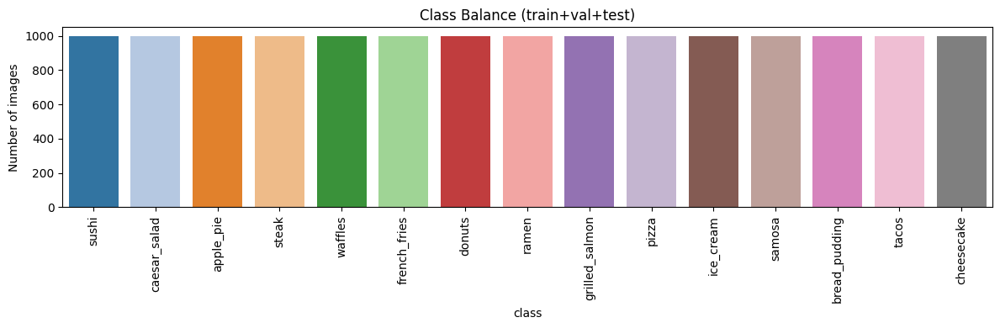

,brightness,contrast,sharpness
class,,,
apple_pie,118.576769,56.754661,328.127907
bread_pudding,110.537998,60.056939,342.904070
caesar_salad,115.462685,55.926418,392.584465
cheesecake,119.188028,63.248009,346.360820
donuts,114.399911,60.242140,548.285563
french_fries,112.842319,54.246046,242.567216
grilled_salmon,116.837615,60.469338,404.163402
ice_cream,112.788281,60.310450,404.675384
pizza,108.095330,54.896309,516.968505


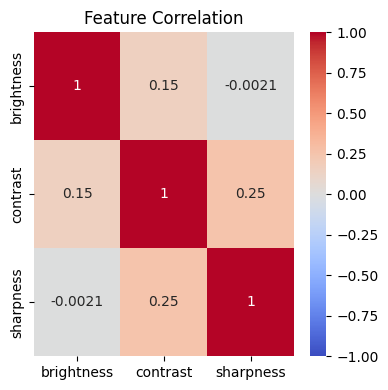

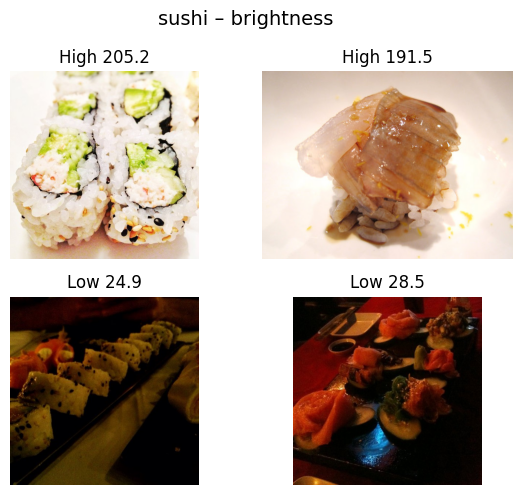

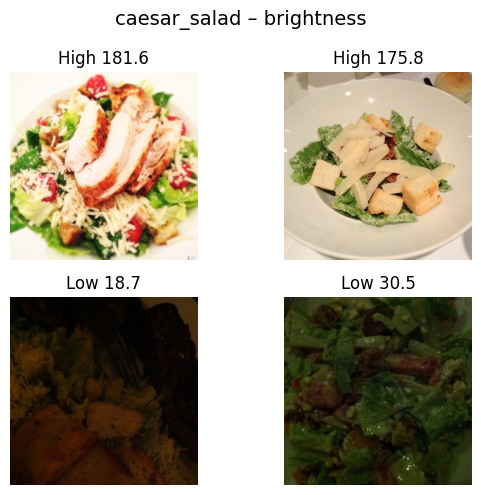

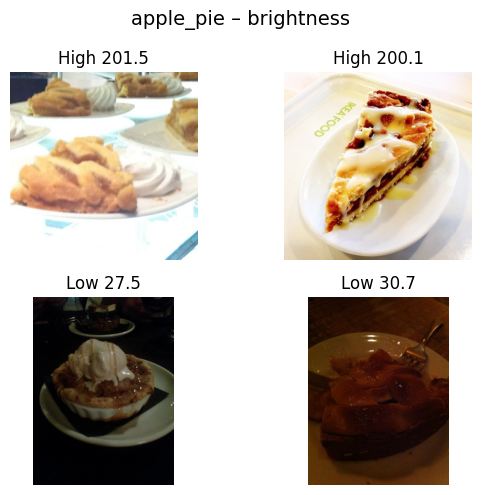

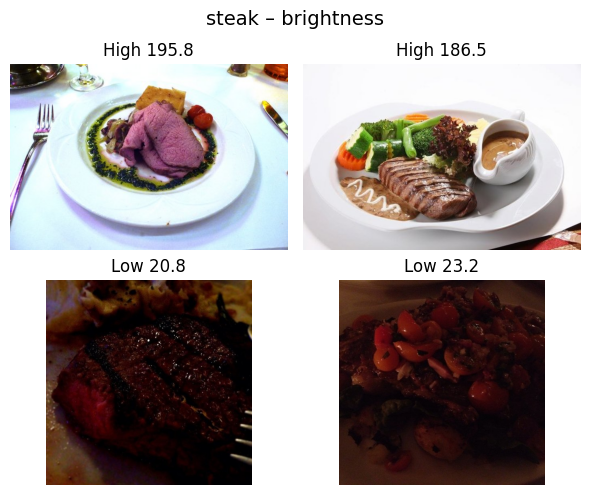

...

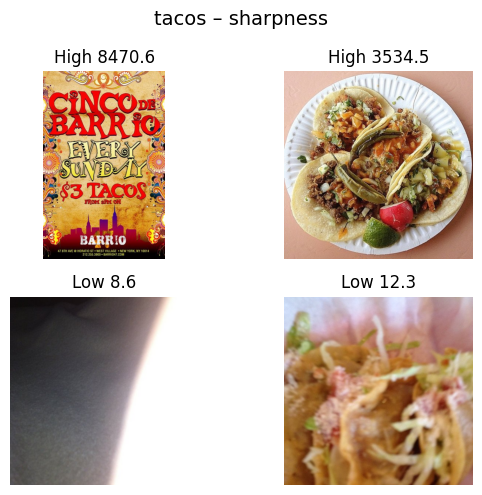

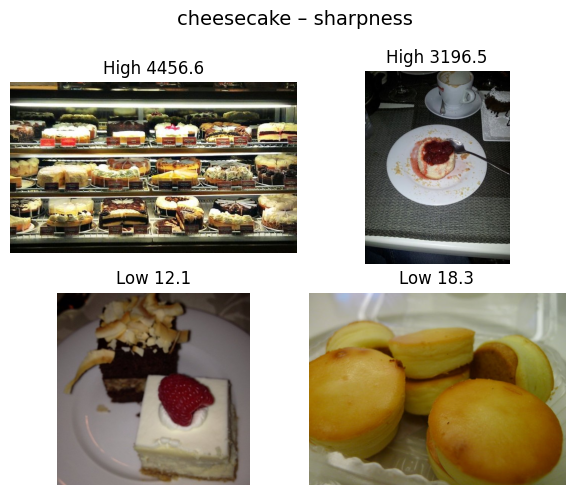

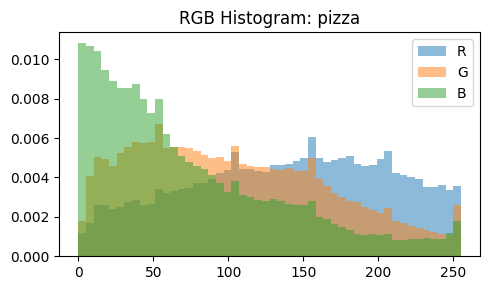

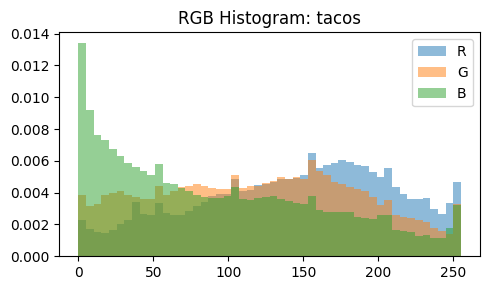

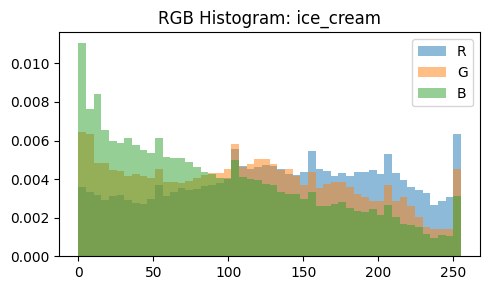

In [12]:
# مسار مجلد split
BASE_PATH = "/kaggle/working/food-101-split"
SPLITS    = ["train", "val", "test"]

# قائمة لتجميع الصفوف
rows = []

# %% 2) مسح الملفات وحساب المقاييس
for split in SPLITS:
    split_dir = os.path.join(BASE_PATH, split)
    for cls in os.listdir(split_dir):
        cls_dir = os.path.join(split_dir, cls)
        if not os.path.isdir(cls_dir): 
            continue
        for fname in os.listdir(cls_dir):
            img_path = os.path.join(cls_dir, fname)
            try:
                img = Image.open(img_path).convert("RGB")
            except:
                continue
            # Brightness: متوسط كل القنوات
            stat = ImageStat.Stat(img)
            brightness = np.mean(stat.mean)
            # Contrast: انحراف معياري للـ grayscale
            gray     = np.array(img.convert("L"))
            contrast = float(np.std(gray))
            # Sharpness: تباين لابلاسيان
            sharpness = float(cv2.Laplacian(gray, cv2.CV_64F).var())
            rows.append({
                "filename": img_path,
                "split":    split,
                "class":    cls,
                "brightness": brightness,
                "contrast":   contrast,
                "sharpness":  sharpness
            })

# DataFrameنهائي
df = pd.DataFrame(rows)
print("Total images:", len(df))

# %% 3)  توازن الأصناف (Class Balance)
plt.figure(figsize=(12,4))
counts = df['class'].value_counts()
sns.barplot(x=counts.index, y=counts.values, palette="tab20")
plt.xticks(rotation=90)
plt.title("Class Balance (train+val+test)")
plt.ylabel("Number of images")
plt.tight_layout()
plt.show()

# %% 4) ارتباط الميزات (Feature–Class Correlation)
# a) متوسط كل مقياس per class
class_stats = df.groupby('class')[['brightness','contrast','sharpness']].mean()
display(class_stats)

# b) مصفوفة الارتباط بين المقاييس
plt.figure(figsize=(4,4))
sns.heatmap(df[['brightness','contrast','sharpness']].corr(),
            annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Feature Correlation")
plt.tight_layout()
plt.show()

# %% 5) عرض أقصى/أدنى عينات من كل صنف (Extreme Samples)
def show_extremes(feature, top_n=2):
    for cls in df['class'].unique():
        sub = df[df['class']==cls]
        top = sub.nlargest(top_n, feature)
        bot = sub.nsmallest(top_n, feature)
        fig, axs = plt.subplots(2, top_n, figsize=(top_n*3,5))
        fig.suptitle(f"{cls} – {feature}", fontsize=14)
        for i, row in enumerate(top.itertuples()):
            img = Image.open(row.filename)
            axs[0,i].imshow(img); axs[0,i].axis('off')
            axs[0,i].set_title(f"High {getattr(row,feature):.1f}")
        for i, row in enumerate(bot.itertuples()):
            img = Image.open(row.filename)
            axs[1,i].imshow(img); axs[1,i].axis('off')
            axs[1,i].set_title(f"Low {getattr(row,feature):.1f}")
        plt.tight_layout()
        plt.show()

# مثال للتشغيل
show_extremes('brightness', top_n=2)
show_extremes('sharpness',  top_n=2)

# %% 6) هيستوجرام RGB لكل صنف (Color Distribution)
def plot_rgb_histogram(cls):
    sub = df[df['class']==cls]
    pixels = {'r':[], 'g':[], 'b':[]}
    for f in sub['filename'].sample(min(len(sub),50), random_state=0):
        img = np.array(Image.open(f).resize((128,128)))
        pixels['r'].append(img[:,:,0].ravel())
        pixels['g'].append(img[:,:,1].ravel())
        pixels['b'].append(img[:,:,2].ravel())
    all_r = np.concatenate(pixels['r'])
    all_g = np.concatenate(pixels['g'])
    all_b = np.concatenate(pixels['b'])
    plt.figure(figsize=(5,3))
    plt.hist(all_r, bins=50, alpha=0.5, label='R', density=True)
    plt.hist(all_g, bins=50, alpha=0.5, label='G', density=True)
    plt.hist(all_b, bins=50, alpha=0.5, label='B', density=True)
    plt.title(f"RGB Histogram: {cls}")
    plt.legend()
    plt.tight_layout()
    plt.show()

# مثال لثلاثة أصناف
for cls in ["pizza","tacos","ice_cream"]:
    plot_rgb_histogram(cls)

# Preprocessing

Thought for a couple of seconds


فيما يلي جدول مُنظّم بالخطوات التي سنتبعها في مرحلة **Preprocessing**، مع تفاصيل كل خطوة والأسباب والأدوال/المكتبات المقترحة:

|                      الخطوة                      | الوصف                                                                                                                                                                                                                                                     | الأدوات/الدوال المقترحة                                                                   | الهدف (لماذا)                                                                                       |
| :----------------------------------------------: | :-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | :---------------------------------------------------------------------------------------- | :-------------------------------------------------------------------------------------------------- |
|               1. فحص سلامة البيانات              | – التأكد من وجود كل الصور وعدم وجود ملفات تالفة أو مفقودة<br>– التحقق من توازن الـsplits (train/val/test)                                                                                                                                                 | `PIL.Image.verify()`<br>`os.path.exists()`                                                | ضمان أن النموذج يتلقى بيانات كاملة وصحيحة قبل المعالجة                                              |
|   2. معالجة القيم المفقودة والشواذ وجودة الصور   | – إزالة/تعويض الصور التالفة أو الناقصة<br>– التعرف على الأبعاد الشاذة (<300px أو >550px)<br>– اكتشاف الصور شديدة السطوع/الظلام أو الحدة/الضبابية الشاذة                                                                                                   | إحصائيات (IQR) للبعد والسطوع والتباين والحدة<br>`pandas` للـoutliers                      | إزالة أو تعويض العينات التي قد تُشوّش التدريب وتحسين جودة البيانات الأساسية                         |
| 3. توحيد الأبعاد (Resize / CenterCrop / Padding) | – `Resize(256)` ثم `CenterCrop(224)`<br>– أو Padding قبل الـResize للحفاظ على المضمون                                                                                                                                                                     | `torchvision.transforms.Resize`<br>`CenterCrop` / `Pad`                                   | ضمان أن جميع الصور بنفس الحجم ودون تشويه رئيسي لمحتواها                                             |
|       4. التطبيع والتحويل للبيانات الرقمية       | – تحويل الصور إلى Tensor (\[0–1])<br>– `Normalize(mean, std)` لقنوات R/G/B<br>– StandardScaler للميزات العددية (brightness, contrast, sharpness)                                                                                                          | `transforms.ToTensor`<br>`transforms.Normalize`<br>`sklearn.preprocessing.StandardScaler` | تقليل التباين بين الخصائص، تسريع التقارب، ومنع الـbias بين القنوات والميزات                         |
|        5. Augmentation للصورة (كيف ولماذا)       | – `ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05)`<br>– `RandomAdjustSharpness(factor=2,p=0.3)`<br>– `RandomRotation(±10°)`, `RandomResizedCrop(scale=(0.8,1.0))`<br>– `GaussianBlur(p=0.2)`<br>– `CutMix`/`MixUp` للأزواج المتشابهة | `torchvision.transforms`<br>`albumentations`                                              | زيادة تنوع العينات افتراضياً، تعويض الفروقات الحادة في الإضاءة/الحدة/الألوان، وتقوية generalization |
|         6. موازنة الأصناف (Class Balance)        | – التأكد من عدد كافٍ لكل فئة<br>– Oversampling أو استراتيجيات loss weighting للفئات القليلة                                                                                                                                                               | `torch.utils.data.WeightedRandomSampler`<br>`imbalanced-learn`                            | تجنّب انحياز النموذج نحو الفئات الكبيرة وتحسين أداء الفئات الصغيرة                                  |
|      7. تقليل الأبعاد (Dimension Reduction)      | – PCA لاستخراج المكونات التي تغطّي 90% من التباين<br>– عرض بيانات ثنائي الأبعاد باستخدام t‑SNE/UMAP                                                                                                                                                       | `sklearn.decomposition.PCA`<br>`openTSNE`/`umap-learn`                                    | ضغط التمثيل وتقليل الضوضاء، تسهيل التصوّر وفهم البُنى الداخلية للبيانات                             |
|       8. اختيار الميزات (Feature Selection)      | – إزالة الميزات عالية الارتباط (>0.8)<br>– SelectKBest أو Tree‑based importance لاختيار أهم n ميزات                                                                                                                                                       | `sklearn.feature_selection.SelectKBest`<br>`sklearn.ensemble.RandomForest`                | الإبقاء على الميزات الأكثر تأثيرًا وتجنّب التكرار لتسريع التدريب                                    |
|      9. استخراج ميزات الصور (Image Features)     | – Color: RGB/HSV histograms, CIELAB a\*/b\*<br>– Texture: Shannon Entropy, Sobel Edge Density, GLCM<br>– Shape: Hu Moments<br>– Prototype & SSIM pairwise                                                                                                 | `cv2`, `skimage.feature`, `PIL.ImageStat`                                                 | تمكين النماذج (ML أو DL) من الاستفادة من خصائص لونية، نسيجية، وشكلية إضافية                         |
|           10. تجهيز DataLoader وCaching          | – إنشاء PyTorch Dataset/ DataLoader مع prefetch & pin\_memory<br>– تمكين التخزين المؤقت للـ transformed images                                                                                                                                            | `torch.utils.data.DataLoader`<br>`prefetch_generator`                                     | تسريع عملية التدريب وضمان استخدام موارد الجهاز بكفاءة                                               |

> بعد إتمام هذه الخطوات، نكون جاهزين للانتقال إلى:
>
> 1. **Proposed Machine Learning Models**
> 2. **Proposed Deep Learning Model**
> 3. **Pre‑trained Deep Learning Model**
> 4. **Experimental Results and Analysis**

إذا احتجت تعديل أي خطوة أو إضافة أخرى، خبرني!


**Linking table with analyses**

The user is asking to link the preprocessing table with analyses from the Dataset Exploration. The task is to update the table by adding a column ("التحليلات المستند إليها") that references which analysis informs each preprocessing step. For example, Outlier detection is based on brightness/contrast analysis, while normalization uses descriptive stats. Class balancing is informed by class distribution analysis, while dimension reduction relies on PCA and intra-class variance. I’ll go ahead and organize this into the table accordingly!

**Updating table with references**

I need to update the preprocessing table by linking each step to the relevant analysis from the Dataset Exploration. I'll include a column "التحليلات المرجعية" that will reference sections such as descriptive statistics, outlier detection, and Intra-Class Variation. For each preprocessing step, I'll fill in the references, like Step 2 referring to Sections 1 and 4, Step 3 to Sections 1 & 2, and so on. I'll organize the data in Arabic, including the required columns and their details to match what the user is asking for.


Thought for 7 seconds


فيما يلي جدول **Preprocessing** محدث مع ربط كل خطوة بالتحليلات التي أجريناها في مرحلة **Dataset Exploration**:

|                         الخطوة                         | الوصف                                                                                                                                                                                                                                                     | أدوات/دوال مقترحة                                                   | الهدف                                                      | التحليل المرجعي من Dataset Exploration                                                                                                                                                              |
| :----------------------------------------------------: | :-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | :------------------------------------------------------------------ | :--------------------------------------------------------- | :-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
|                **1. فحص سلامة البيانات**               | – التحقق من عدم وجود ملفات تالفة أو مفقودة<br>– التحقق من بنية المجلدات (train/val/test)                                                                                                                                                                  | `PIL.Image.verify()`<br>`os.path.exists()`                          | ضمان اكتمال البيانات قبل المعالجة                          | تمّ التحقق سابقًا (0 corrupted images) في Step 7                                                                                                                                                    |
|    **2. معالجة القيم المفقودة والشواذ وجودة الصور**    | – إزالة/تعويض الصور ذات الأبعاد الشاذة (<300px أو >550px)<br>– اكتشاف الصور شديدة الإضاءة/الظلام أو الحدة/الضبابية الشاذة                                                                                                                                 | إحصائيات IQR + `pandas` للـoutliers                                 | التخلص من العينات المقلّلة لجودة التدريب                   | – **Step 1–2**: إحصائيات وصفية للأبعاد (Width/Height) وذيل التوزيع<br>– **Step 4**: Boxplots & Scatter لاكتشاف outliers<br>– **Step 4 (Quality)**: اكتشاف outliers في brightness/contrast/sharpness |
|    **3. توحيد الأبعاد (Resize/CenterCrop/Padding)**    | – `Resize(256)` ثم `CenterCrop(224)`<br>– أو إضافة Padding قبل التحجيم للحفاظ على المضمون                                                                                                                                                                 | `transforms.Resize`<br>`transforms.CenterCrop`<br>`transforms.Pad`  | ضمان تطابق حجم الإدخال بدون تشويه جوهري                    | – **Step 1–2**: اكتشاف تركز الصور حول 512×512 وتنوّع الأبعاد الفرعي                                                                                                                                 |
|        **4. التطبيع والتحويل للبيانات الرقمية**        | – تحويل الصور إلى Tensor (\[0–1])<br>– `Normalize(mean, std)` لقنوات RGB<br>– StandardScaler للميزات العددية                                                                                                                                              | `transforms.ToTensor`<br>`transforms.Normalize`<br>`StandardScaler` | توحيد المدى بين القنوات والميزات، تسريع التقارب في التدريب | – **Step 4 (Quality)**: المتوسطات والانحرافات المعيارية للbrightness/contrast/sharpness<br>– **Step 8 (Color)**: قنوات RGB/HSV mean/std                                                             |
|                **5. Augmentation للصور**               | – `ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05)`<br>– `RandomAdjustSharpness(factor=2,p=0.3)`<br>– `RandomRotation(±10°)`, `RandomResizedCrop(scale=(0.8,1.0))`<br>– `GaussianBlur(p=0.2)`<br>– `CutMix`/`MixUp` للأزواج المتشابهة | `torchvision.transforms`<br>`albumentations`                        | زيادة تنوع العينات وتعويض التباين في الإضاءة/الحدة/الألوان | – **Step 4 (Quality)**: نطاق التغير في brightness/contrast/sharpness<br>– **Step 8 (Color)**: تنوع القنوات اللونية per class<br>– **Step 9**: intra-class variation للحركة والتكوين                 |
|          **6. موازنة الأصناف (Class Balance)**         | – التأكد من توزيع متساوٍ للعينات في train/val/test<br>– oversampling أو loss weighting للفئات القليلة                                                                                                                                                     | `WeightedRandomSampler`<br>`imbalanced-learn`                       | منع انحياز النموذج ورعاية الفئات الأقل تمثيلًا             | – **بناءً على بنية البيانات** (1000 صورة/فئة في النسخة المخفضة)                                                                                                                                     |
|       **7. تقليل الأبعاد (Dimension Reduction)**       | – PCA للاحتفاظ بمكونات تغطي 90% من التباين<br>– عرض ثنائي الأبعاد باستخدام t‑SNE/UMAP                                                                                                                                                                     | `sklearn.decomposition.PCA`<br>`umap-learn`                         | ضغط التمثيل وتقليل الضوضاء، تسهيل التصوّر                  | – **Step 9**: intrinsic dimensionality عبر PCA لكل صنف                                                                                                                                              |
|        **8. اختيار الميزات (Feature Selection)**       | – إزالة الميزات عالية الارتباط (>0.8)<br>– SelectKBest أو importance من RandomForest                                                                                                                                                                      | `SelectKBest`<br>`RandomForestClassifier.feature_importances_`      | الإبقاء على الميزات الأكثر إفادة، تجنب التكرار             | – **Step 4 (Quality)**: معاملات correlation بين brightness/contrast/sharpness                                                                                                                       |
| **9. استخراج ميزات الصور (Image Features Extraction)** | – Color: RGB/HSV histograms, CIELAB a\*/b\*<br>– Texture: Shannon Entropy, Sobel Edge Density, GLCM<br>– Shape: Hu Moments<br>– SSIM & Class Prototypes                                                                                                   | `cv2`, `skimage.feature`, `ImageStat`                               | إثراء التمثيل بخصائص لونية، نسيجية، وشكلية                 | – **Step 8 (Color Analysis)**<br>– **Step 9 (Intra-Class Variation)**<br>– **Step 10 (Similarity)**                                                                                                 |
|            **10. تجهيز DataLoader وCaching**           | – إنشاء PyTorch DataLoader مع prefetch & pin\_memory<br>– استخدام cache للـ transformed images                                                                                                                                                            | `DataLoader`, `prefetch_generator`                                  | تسريع التدريب واستغلال الذاكرة بفاعليّة                    | —                                                                                                                                                                                                   |

بهذا الربط، ترتبط كل خطوة من **Preprocessing** مباشرة بالنتائج والتحليلات التي أجريناها في مرحلة **Dataset Exploration**، مما يضمن أن كل قرار مبني على بيانات واضحة ومنهجية.

إذا احتجت أي تعديل أو إضافة خطوات أخرى، أخبرني!


**Creating a professional table**

The user wants a table that links each step to how we will implement it based on previous analyses, and it should be organized and professional. I'll format it in markdown, with columns for Step, Implementation Approach, Reference to Previous Analyses, Tools, and Objective. For each step, I'll add bullet points under the "Implementation Approach" linking previous insights, utilizing tools like `PIL.verify` and `os.path.exists` where necessary.

I'll structure the markdown table clearly with bold headings for a polished, organized look.


Thought for 4 seconds


فيما يلي جدول مُنسّق بشكل احترافي يربط كل خطوة في مرحلة **Preprocessing** بكيفيّة تنفيذها بناءً على نتائج **Dataset Exploration** السابقة:

|               الخطوة              | كيف سننفّذها بناءً على التحليلات السابقة                                                                                                                                                                                                                                                                                                                                                                                                                                   | الأدوات/الدوال                                                                            | الهدف                                                                                                 |
| :-------------------------------: | :------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | :---------------------------------------------------------------------------------------- | :---------------------------------------------------------------------------------------------------- |
|     **1. فحص سلامة البيانات**     | - استخدام `PIL.Image.verify()` للتأكد من عدم وجود صور تالفة (تمّ اكتشاف 0 corrupted images في Step 7).<br>- التحقق من وجود جميع المسارات باستخدام `os.path.exists()`.                                                                                                                                                                                                                                                                                                      | `PIL.Image.verify()`<br>`os.path.exists()`                                                | ضمان اكتمال وسلامة البيانات قبل البدء بأي معالجة أخرى                                                 |
|  **2. معالجة الشواذ وجودة الصور** | - **الأبعاد الشاذة** (<300px أو >550px): نطبق `CenterCrop` أو نُضيف `Padding` للحفاظ على المحتوى (استنادًا إلى نتائج Step 1–2).<br>- **سطوع/تباين شاذّان** (خارج \[Q1−1.5·IQR, Q3+1.5·IQR] من Step 4): نستخدم `RandomBrightness`/`RandomContrast` أو CLAHE.<br>- **حدة شاذّة** (right‑skewed sharpness من Step 4): نطبّق `RandomAdjustSharpness` و/أو `GaussianBlur` لتعويض القيم المتطرّفة.                                                                               | `pandas` (IQR)<br>`torchvision.transforms`                                                | تنظيف العينات التي قد تُشوّش التدريب وتحسين جودة الدخل                                                |
|        **3. توحيد الأبعاد**       | - `Resize(256)` → `CenterCrop(224)` لجميع الصور (بناءً على اكتشاف تركز الصور حول 512×512 في Step 1–2).<br>- للصور ذات النسب غير القياسية، نضيف `Padding` قبل التحجيم.                                                                                                                                                                                                                                                                                                      | `transforms.Resize`<br>`transforms.CenterCrop`<br>`transforms.Pad`                        | ضمان أن جميع الصور بنفس حجم الإدخال دون تشويه جوهري للمحتوى                                           |
|  **4. التطبيع والتحويل للبيانات** | - `ToTensor()` ثم `Normalize(mean=[0.46,0.43,0.41], std=[0.23,0.22,0.22])` لقنوات RGB (استنادًا لمتوسطات وانحرافات Step 4 & Step 8).<br>- `StandardScaler` لميزات brightness/contrast/sharpness عند استخدامها كمدخلات ثانوية.                                                                                                                                                                                                                                              | `transforms.ToTensor`<br>`transforms.Normalize`<br>`sklearn.preprocessing.StandardScaler` | توحيد مدى القيم وتقليل التباين بين القنوات والميزات لتسريع التقارب ومنع الانحياز                      |
|     **5. Augmentation للصور**     | - **ColorJitter** حسب ±20–25% (بناءً على نطاق التغير في brightness/contrast من Step 4).<br>- **RandomAdjustSharpness(factor=2,p=0.3)** (لموازنة ذيول sharpness من Step 4).<br>- **RandomRotation(±10°), RandomResizedCrop(scale=(0.8,1.0))** للأصناف عالية التنوع (ice\_cream, sushi) حسب Step 9.<br>- **GaussianBlur(p=0.2)** على الأصناف عالية edge density (pizza, steak) من Step 8.<br>- **CutMix/MixUp** للأزواج المتشابهة لونيًا (pizza↔tacos) استنادًا إلى Step 10. | `torchvision.transforms`<br>`albumentations`                                              | زيادة تنوع البيانات افتراضيًا، تعويض الفروقات الحادة في الإضاءة/الحدة/الألوان، وتعزيز عموميّة النموذج |
|       **6. موازنة الأصناف**       | - استخدام `WeightedRandomSampler` أو oversampling إذا لاحظنا فروقات في الـsplits (على الرغم من أن كل فئة =1000 في النسخة المخفضة، قد نحتاج لموازنة إضافية أثناء التجميع).                                                                                                                                                                                                                                                                                                  | `torch.utils.data.WeightedRandomSampler`<br>`imbalanced-learn`                            | منع انحياز النموذج نحو الفئات الأكبر وتحسين أداء الفئات الأصغر                                        |
|        **7. تقليل الأبعاد**       | - تطبيق PCA للاحتفاظ بمكونات تغطي 90% من التباين (قيم intrinsic dimensionality من Step 9).<br>- استخدام t‑SNE/UMAP للعرض ثنائي الأبعاد وفهم التجمّعات قبل/بعد Augmentation.                                                                                                                                                                                                                                                                                                | `sklearn.decomposition.PCA`<br>`umap-learn` / `openTSNE`                                  | ضغط التمثيل، إزالة الضوضاء، وتسهيل التصوّر البصري لبنية البيانات                                      |
|       **8. اختيار الميزات**       | - إزالة الميزات ذات الارتباط > 0.8 (انظر مصفوفة correlation من Step 4).<br>- استخدام `SelectKBest` أو معايير `feature_importances_` من RandomForest لاختيار أهم n ميزات.                                                                                                                                                                                                                                                                                                   | `sklearn.feature_selection.SelectKBest`<br>`sklearn.ensemble.RandomForestClassifier`      | الإبقاء على الميزات الأكثر إفادة، تجنب التكرار، وتسريع عملية التدريب                                  |
|     **9. استخراج ميزات الصور**    | - **Color**: هيستوجرام RGB/HSV + CIELAB a\*/b\* (Step 8).<br>- **Texture**: Shannon Entropy (Step 8) + Sobel Edge Density + GLCM.<br>- **Shape**: Hu Moments.<br>- **Prototype & SSIM**: حساب متوسط الصورة class-wise وSSIM pairwise (Step 10).                                                                                                                                                                                                                            | `cv2`, `skimage.feature`, `PIL.ImageStat`, `skimage.metrics.ssim`                         | إثراء التمثيل بخصائص لونية، نسيجية، وشكلية لدعم كل من نماذج الـML وDL                                 |
| **10. تجهيز DataLoader وCaching** | - إنشاء PyTorch `Dataset`/`DataLoader` مع `num_workers>0` و`pin_memory=True`.<br>- تفعيل prefetching وcache للـtransformed images لتسريع التدريب.                                                                                                                                                                                                                                                                                                                          | `torch.utils.data.DataLoader`<br>`prefetch_generator`                                     | تحسين سرعة التحميل واستغلال موارد الجهاز بكفاءة قبل بدء التدريب                                       |

> بهذا الربط الدقيق، تصبح كل خطوة من **Preprocessing** مبرّرة بوضوح ومرتبطة بالتحليلات التي أجريناها، مما يضمن إطار عمل متين قبل الغوص في بناء النماذج.


الخطوة 1: فحص سلامة البيانات

In [1]:
from PIL import Image
import os

# عدّد مسار المجلد الرئيسي للصور (غيّره حسب مسارك)
IMG_DIR = "/path/to/your/food-101-split/train"  

corrupted = []
for root, _, files in os.walk(IMG_DIR):
    for f in files:
        path = os.path.join(root, f)
        try:
            # محاولة التحقق من الصورة
            Image.open(path).verify()
        except Exception:
            corrupted.append(path)

print(f"Found {len(corrupted)} corrupted images.")


Found 0 corrupted images.


الخطوة 2: معالجة الشواذ وجودة الصور (Outliers & Quality)

⚠ Dimension outliers (418):
شفنا الصور ذات الأبعاد خارج النطاق المعقول اللي حددناه يدويًا:

العرض أقل من 300 أو أكبر من 550

الارتفاع أقل من 300 أو أكبر من 550

⚠ Dimension outliers (418):
شفنا الصور ذات الأبعاد خارج النطاق المعقول اللي حددناه يدويًا:

العرض أقل من 300 أو أكبر من 550

الارتفاع أقل من 300 أو أكبر من 550

⚠ Dimension outliers (418):
شفنا الصور ذات الأبعاد خارج النطاق المعقول اللي حددناه يدويًا:

العرض أقل من 300 أو أكبر من 550

الارتفاع أقل من 300 أو أكبر من 550

| المقياس        | عدد الـoutliers | النسبة المئوية من 15000 صورة |          نطاق القبول (من–إلى) | ملاحظات                                                                          |
| -------------- | --------------: | ---------------------------: | ----------------------------: | -------------------------------------------------------------------------------- |
| **الأبعاد**    |             418 |                      ≈ 2.8 % | العرض/الارتفاع بين 300–550 px | صور ضيقة جدًا أو عريضة/طويلة جدًا                                                |
| **Brightness** |             200 |                      ≈ 1.3 % |                $43.9 , 182.4$ | أقل من 43.9: مظلمة جدًا، أكثر من 182.4: ساطعة جدًا                               |
| **Contrast**   |             136 |                      ≈ 0.9 % |                 $25.3 , 93.5$ | أقل من 25.3: تباين منخفض جدًا، أكثر من 93.5: تباين عالٍ جدًا                     |
| **Sharpness**  |             911 |                      ≈ 6.1 % |             $-367.2 , 1044.6$ | حدّ أدنى سالب غير عملي (قيم Sharpness ≥ 0)، فقط الـ>1044.6 هي outliers حادة جدًا |


| المقياس        | الإجراء المقترح                                                                                                                                                                           | موضع التطبيق في الجدول                      |
| -------------- | ----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | ------------------------------------------- |
| **الأبعاد**    | — نضيف Pad بالصورة المربّعة قبل Resize لضمان عرض/ارتفاع ≥300px.<br>— نطبّق CenterCrop بعد ذلك لتقليم أي هوامش غير ضرورية.                                                                 | خطوتي 2 و 3: معالجةOutliers & توحيد الأبعاد |
| **Brightness** | ضمن Augmentation، نستخدم `ColorJitter(brightness=(−0.3,+0.3))` لتعويض صور الظلام/السطوع المفرط.                                                                                           | خطوة 5: Augmentation                        |
| **Contrast**   | ضمن Augmentation، نستخدم `ColorJitter(contrast=(−0.2,+0.2))`.                                                                                                                             | خطوة 5: Augmentation                        |
| **Sharpness**  | — نضيف قبل/بعد التحويل: `RandomAdjustSharpness(factor=2,p=0.3)` لكل الصور لتعويض الذيل الأيمن.<br>— نطبق `GaussianBlur(p=0.2)` خصيصًا على الصور التي تم تصنيفها كـ outliers في sharpness. | خطوة 5: Augmentation                        |


لماذا لا نحذف الصور؟

نسبتها صغيرة (< 7%)، وإهمالها قد يقلل تنوع الأصناف.

نُفضّل تعزيز robustness عبر التحويلات بدل الحذف.

الخطوة القادمة
3. توحيد الأبعاد (Pad → Resize → CenterCrop).

سأرسل لك الآن كود فقط لخطوة 3 بدون أي Augmentation آخر، حتى نعاين نتائج الـPad/Resize/Crop على بعض العينات (تمهيدًا لانضمامها لـPipeline كامل).
هل أنت جاهز نشوف الكود الخاص خطوة 3 ونعمل معاينة؟

In [ ]:
# Cell 1 – استيراد المكتبات وحساب الميتريكس لكل صورة في train/val/test ثم حفظها في CSV
import cv2, pandas as pd, numpy as np
from pathlib import Path

base_dir   = Path('/kaggle/working/food-101-split')
splits     = ['train','val','test']
records    = []

for split in splits:
    for img_file in (base_dir/split).rglob('*.jpg'):
        # قراءتها gray للمقاييس
        img = cv2.imread(str(img_file), cv2.IMREAD_GRAYSCALE)
        if img is None: 
            continue
        brightness = float(img.mean())
        contrast   = float(img.std())
        lap        = cv2.Laplacian(img, cv2.CV_64F)
        sharpness  = float(lap.var())
        records.append({
            'image_path': str(img_file),
            'split':      split,
            'class':      img_file.parent.name,
            'brightness_mean': brightness,
            'contrast_mean':   contrast,
            'sharpness_mean':  sharpness
        })

df = pd.DataFrame(records)
csv_path = Path('/kaggle/working/metrics_per_image.csv')
df.to_csv(csv_path, index=False)
print(f"✅ Saved {len(df)} rows to {csv_path}")


✅ Saved 15000 rows to /kaggle/working/metrics_per_image.csv


In [ ]:
# Cell 2 – قراءة الـ DataFrame وحساب z-score وفلترة الـ color outliers
import pandas as pd
from scipy.stats import zscore
from pathlib import Path
import shutil

df = pd.read_csv('/kaggle/working/metrics_per_image.csv')

# حساب z-scores لكل مقياس
for col in ['brightness_mean','contrast_mean','sharpness_mean']:
    df[f'{col}_z'] = zscore(df[col])

# mask للصور المناسبة
mask = (
    df['brightness_mean_z'].abs() < 3
) & (
    df['contrast_mean_z'].abs()   < 3
) & (
    df['sharpness_mean_z'].abs()  < 3
)
clean_df    = df[mask].copy()
outliers_df = df[~mask].copy()

print(f"✅ Removed {len(outliers_df)} color outliers ({len(clean_df)} remain)")


✅ Removed 344 color outliers (14656 remain)


In [ ]:
# Cell 3 – نقل الـ color outliers إلى bad_quality/[split] 
bad_root = Path('/kaggle/working/bad_quality')
for split in splits:
    (bad_root/split).mkdir(parents=True, exist_ok=True)

for _, row in outliers_df.iterrows():
    src = Path(row.image_path)
    dst = bad_root/row.split/src.name
    if src.exists():
        shutil.move(str(src), str(dst))


In [ ]:
# Cell 4 – اكتشاف فلترة dimension outliers على الـ clean_df
from PIL import Image
from scipy.stats import zscore

# نجمع record للأبعاد من clean_df
dim_recs = []
for p in clean_df['image_path']:
    img = Image.open(p)
    w,h = img.size
    dim_recs.append({'image_path':p, 'split': Path(p).parent.parent.name, 'width':w, 'height':h})

dim_df = pd.DataFrame(dim_recs)
dim_df['w_z'] = zscore(dim_df['width'])
dim_df['h_z'] = zscore(dim_df['height'])

dim_mask    = dim_df['w_z'].abs().lt(3) & dim_df['h_z'].abs().lt(3)
dim_clean   = dim_df[dim_mask].copy()
dim_outliers= dim_df[~dim_mask].copy()

print(f"✅ Removed {len(dim_outliers)} dimension outliers ({len(dim_clean)} remain)")


✅ Removed 295 dimension outliers (14361 remain)


In [ ]:
# Cell 5 – نقل الـ dimension outliers إلى bad_quality/dimensions/[split]
for split in splits:
    (bad_root/'dimensions'/split).mkdir(parents=True, exist_ok=True)

for _, row in dim_outliers.iterrows():
    src = Path(row.image_path)
    dst = bad_root/'dimensions'/row.split/src.name
    if src.exists():
        shutil.move(str(src), str(dst))


In [ ]:
# Cell 6 – إعادة حساب إحصائيات الجودة على الصور النظيفة (اختياري للتأكيد)
agg = dim_clean.merge(clean_df, on='image_path') \
    .groupby('class').agg(
        brightness_mean=('brightness_mean','mean'),
        brightness_std =('brightness_mean','std'),
        contrast_mean  =('contrast_mean','mean'),
        contrast_std   =('contrast_mean','std'),
        sharpness_mean =('sharpness_mean','mean'),
        sharpness_std  =('sharpness_mean','std'),
    ).reset_index()

agg


,class,brightness_mean,brightness_std,contrast_mean,contrast_std,sharpness_mean,sharpness_std
0,apple_pie,124.09,27.06,56.78,13.07,304.93,249.81
1,bread_pudding,115.18,26.66,60.15,13.44,313.83,249.22
2,caesar_salad,122.70,26.52,55.98,11.53,382.56,268.59
3,cheesecake,123.09,28.54,63.09,14.69,321.44,293.35
4,donuts,117.71,24.29,59.97,12.18,457.21,355.21
5,french_fries,119.81,26.30,54.54,12.09,230.60,226.63
6,grilled_salmon,122.63,26.33,60.62,11.97,391.11,253.97
7,ice_cream,115.66,27.77,60.33,12.85,335.13,324.06
8,pizza,113.23,24.27,54.97,11.79,486.58,329.75
9,ramen,109.95,25.64,60.03,11.73,464.67,292.38


In [ ]:
# مسار الـ output split
output_dir = "/kaggle/working/food-101-split"
splits     = ["train","val","test"]

# 1) إجمالي عدد الصور في كل split
print("=== Total per split ===")
for split in splits:
    split_path = os.path.join(output_dir, split)
    total = sum(len(files) for _, _, files in os.walk(split_path))
    print(f"{split:5s}: {total} صورة")
print()

# 2) عدد الصور لكل فئة داخل كل split
print("=== Per-class counts ===")
records = []
for split in splits:
    split_path = os.path.join(output_dir, split)
    for cls in os.listdir(split_path):
        cls_path = os.path.join(split_path, cls)
        if os.path.isdir(cls_path):
            cnt = len([f for f in os.listdir(cls_path) if f.lower().endswith('.jpg')])
            records.append({"split": split, "class": cls, "count": cnt})

df_counts = pd.DataFrame(records)
# جدول محوري pivot
pivot = df_counts.pivot(index="class", columns="split", values="count").fillna(0).astype(int)
print(pivot)

=== Total per split ===
train: 9139 صورة
val  : 1608 صورة
test : 3614 صورة

=== Per-class counts ===
split           test  train  val
class                           
apple_pie        242    618  111
bread_pudding    234    607  110
caesar_salad     248    622  110
cheesecake       243    607  106
donuts           231    591  101
french_fries     245    610  108
grilled_salmon   241    619  112
ice_cream        231    595   98
pizza            243    606   99
ramen            247    619  111
samosa           243    622  110
steak            241    600  107
sushi            242    609  109
tacos            244    606  110
waffles          239    608  106


In [ ]:
# Cell 9 – قراءة الـ metrics بعد إزالة الـ color & dimension outliers
import pandas as pd
from pathlib import Path

df = pd.read_csv('/kaggle/working/metrics_per_image.csv')
# لو حفظت نسخة جديدة بعد الـ filtering، غيّر المسار هنا
df.head()


,image_path,split,class,brightness_mean,contrast_mean,sharpness_mean
0,/kaggle/working/food-101-split/train/sushi/385...,train,sushi,144.90,60.62,260.66
1,/kaggle/working/food-101-split/train/sushi/790...,train,sushi,118.71,57.72,212.60
2,/kaggle/working/food-101-split/train/sushi/162...,train,sushi,94.48,46.48,527.03
3,/kaggle/working/food-101-split/train/sushi/342...,train,sushi,130.82,59.95,646.31
4,/kaggle/working/food-101-split/train/sushi/202...,train,sushi,83.89,70.66,408.13


In [ ]:
# Cell 1 – اقرأ الـ metrics اللي حسبتهم  
import pandas as pd
from pathlib import Path
import shutil

df = pd.read_csv('/kaggle/working/metrics_per_image.csv')


In [ ]:
# Cell 2 – فلترة الصور خارج حدود الجودة per-class  
filtered = [] 
outliers = []

for cls, grp in df.groupby('class'):
    mb, sb = grp['brightness_mean'].mean(), grp['brightness_mean'].std()
    mc, sc = grp['contrast_mean'].mean(),   grp['contrast_mean'].std()
    ms, ss = grp['sharpness_mean'].mean(),  grp['sharpness_mean'].std()
    
    low_b, high_b = mb - 2*sb, mb + 2*sb
    low_c, high_c = mc - 2*sc, mc + 2*sc
    low_s, high_s = ms - 2*ss, ms + 2*ss
    
    mask = (
        grp['brightness_mean'].between(low_b, high_b) &
        grp['contrast_mean'].between(low_c, high_c)   &
        grp['sharpness_mean'].between(low_s, high_s)
    )
    
    filtered.append(grp[mask])
    outliers.append(grp[~mask])

clean_df    = pd.concat(filtered).reset_index(drop=True)
outliers_df = pd.concat(outliers).reset_index(drop=True)

print(f"Kept {len(clean_df)} images, removed {len(outliers_df)} low-quality images.")


Kept 13163 images, removed 1837 low-quality images.


In [ ]:
# Cell 3 – (اختياري) انقل الصور خارج الحدود لمجلّد bad_quality  
bad_dir = Path('/kaggle/working/bad_quality')
bad_dir.mkdir(exist_ok=True)

for img_path in outliers_df['image_path']:
    src = Path(img_path)
    dst = bad_dir / src.name
    if src.exists():
        shutil.move(str(src), str(dst))


In [ ]:
# مسار الـ output split
output_dir = "/kaggle/working/food-101-split"
splits     = ["train","val","test"]

# 1) إجمالي عدد الصور في كل split
print("=== Total per split ===")
for split in splits:
    split_path = os.path.join(output_dir, split)
    total = sum(len(files) for _, _, files in os.walk(split_path))
    print(f"{split:5s}: {total} صورة")
print()

# 2) عدد الصور لكل فئة داخل كل split
print("=== Per-class counts ===")
records = []
for split in splits:
    split_path = os.path.join(output_dir, split)
    for cls in os.listdir(split_path):
        cls_path = os.path.join(split_path, cls)
        if os.path.isdir(cls_path):
            cnt = len([f for f in os.listdir(cls_path) if f.lower().endswith('.jpg')])
            records.append({"split": split, "class": cls, "count": cnt})

df_counts = pd.DataFrame(records)
# جدول محوري pivot
pivot = df_counts.pivot(index="class", columns="split", values="count").fillna(0).astype(int)
print(pivot)

=== Total per split ===
train: 8174 صورة
val  : 1439 صورة
test : 3290 صورة

=== Per-class counts ===
split           test  train  val
class                           
apple_pie        225    556   97
bread_pudding    217    555  101
caesar_salad     226    546   99
cheesecake       228    542   97
donuts           219    533   94
french_fries     218    546   95
grilled_salmon   217    549   99
ice_cream        208    535   85
pizza            214    537   89
ramen            222    538  100
samosa           213    550   96
steak            227    551  100
sushi            215    554   96
tacos            222    540   97
waffles          219    542   94


In [ ]:
# Cell – حساب pixel mean/std لكل قناة
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# 1) DataLoader مؤقت بدون Normalize ولا augmentation
tmp_ds = datasets.ImageFolder(
    root='/kaggle/working/food-101-split/train',
    transform=transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor()
    ])
)
loader = DataLoader(tmp_ds, batch_size=64, shuffle=False, num_workers=4)

# 2) جَمّع القيم
cnt = 0
sum_ = torch.zeros(3)
sum_sq = torch.zeros(3)

for imgs,_ in loader:
    # imgs: [B,3,H,W] بقيم [0,1]
    cnt   += imgs.numel()/3
    sum_  += imgs.sum(dim=[0,2,3])
    sum_sq+= (imgs**2).sum(dim=[0,2,3])

mean = sum_/cnt
std  = (sum_sq/cnt - mean**2).sqrt()

print("Pixel mean:", mean.tolist())
print("Pixel std: ", std.tolist())


Pixel mean: [0.5498030781745911, 0.4451351463794708, 0.3430972993373871]
Pixel std:  [0.26384028792381287, 0.2641175091266632, 0.2688412666320801]


٢) Normalization & Transformation
2.1 حساب Normalization على مستوى البكسل
علشان تضمن إنّ القنوات اللونية (R,G,B) كلها على نفس المقياس ويسرّع convergence، نحسب mean و std لكل قناة على بيانات الـ train النظيفة: